In [428]:
import warnings
warnings.simplefilter("ignore") # Silence warnings
import numpy as np
import xarray as xr
import cmaps
import matplotlib.pyplot as plt         # to generate plots
from mpl_toolkits.basemap import Basemap # plot on map projections
from matplotlib.pylab import rcParams
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.ticker as mticker
import matplotlib.ticker as ticker
import geoviews as gv
import hvplot.xarray
import holoviews as hv
rcParams['figure.figsize'] = 15, 6

读取sst数据以及陆地掩膜数据

分辨率为1°x1°

In [429]:
fnc = 'I:/sst.mnmean.nc'
ds = xr.open_dataset(fnc).sel(time=slice('2000', '2009'))
print(ds)

<xarray.Dataset> Size: 31MB
Dimensions:    (lat: 180, lon: 360, time: 120, nbnds: 2)
Coordinates:
  * lat        (lat) float32 720B 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * lon        (lon) float32 1kB 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
  * time       (time) datetime64[ns] 960B 2000-01-01 2000-02-01 ... 2009-12-01
Dimensions without coordinates: nbnds
Data variables:
    sst        (time, lat, lon) float32 31MB ...
    time_bnds  (time, nbnds) datetime64[ns] 2kB ...
Attributes:
    title:          NOAA Optimum Interpolation (OI) SST V2
    Conventions:    CF-1.0
    history:        Wed Apr  6 13:47:45 2005: ncks -d time,0,278 SAVEs/sst.mn...
    comments:       Data described in  Reynolds, R.W., N.A. Rayner, T.M.\nSmi...
    platform:       Model
    source:         NCEP Climate Modeling Branch
    institution:    National Centers for Environmental Prediction
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    dataset_title:  NOAA Opti

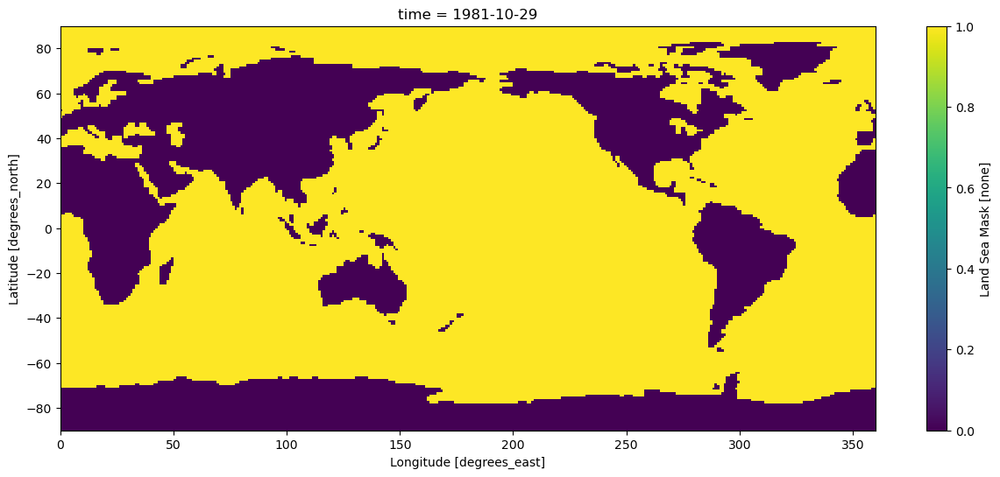

In [430]:
dmask = xr.open_dataset('I:/lsmask.nc')
lsmask = dmask['mask'][0]
lsmask.plot()

其中，0表示陆地，1表示海洋。

In [431]:
lon    = ds['lon'][:]
lat    = ds['lat'][:]

In [432]:
ds

<xarray.Dataset> Size: 31MB
Dimensions:    (lat: 180, lon: 360, time: 120, nbnds: 2)
Coordinates:
  * lat        (lat) float32 720B 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * lon        (lon) float32 1kB 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
  * time       (time) datetime64[ns] 960B 2000-01-01 2000-02-01 ... 2009-12-01
Dimensions without coordinates: nbnds
Data variables:
    sst        (time, lat, lon) float32 31MB ...
    time_bnds  (time, nbnds) datetime64[ns] 2kB ...
Attributes:
    title:          NOAA Optimum Interpolation (OI) SST V2
    Conventions:    CF-1.0
    history:        Wed Apr  6 13:47:45 2005: ncks -d time,0,278 SAVEs/sst.mn...
    comments:       Data described in  Reynolds, R.W., N.A. Rayner, T.M.\nSmi...
    platform:       Model
    source:         NCEP Climate Modeling Branch
    institution:    National Centers for Environmental Prediction
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    dataset_title:  NOAA Optimum Interpolation (OI) SST V2
    source_url:     http://www.emc.ncep.noaa.gov/research/cmb/sst_analysis/

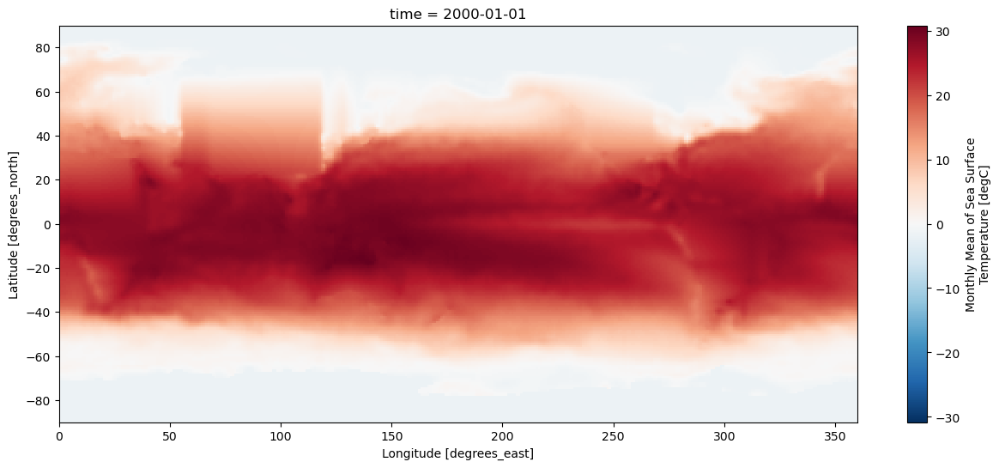

In [433]:
ds.sst[0].plot()    

In [434]:
sst = ds.sst.where(lsmask == 1)

In [435]:
sst

<xarray.DataArray 'sst' (time: 120, lat: 180, lon: 360)> Size: 31MB
array([[[-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.77, -1.77, -1.77, ..., -1.79, -1.79, -1.79],
        ...,
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

       [[-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.78, -1.78, -1.78, ..., -1.79, -1.79, -1.79],
        ...,
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

       [[-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        ...,
...
        ...,
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

       [[-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        ...,
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

       [[-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.79, -1.79, -1.79, ..., -1.79, -1.79, -1.79],
        [-1.79, -1.78, -1.78, ..., -1.79, -1.79, -1.79],
        ...,
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]]], dtype=float32)
Coordinates:
  * lat      (lat) float32 720B 89.5 88.5 87.5 86.5 ... -86.5 -87.5 -88.5 -89.5
  * lon      (lon) float32 1kB 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
  * time     (time) datetime64[ns] 960B 2000-01-01 2000-02-01 ... 2009-12-01
Attributes: (12/13)
    long_name:             Monthly Mean of Sea Surface Temperature
    unpacked_valid_range:  [-5. 40.]
    actual_range:          [-1.7999996 35.56862  ]
    units:                 degC
    precision:             2
    var_desc:              Sea Surface Temperature
    ...                    ...
    level_desc:            Surface
    statistic:             Mean
    parent_stat:           Weekly Mean
    standard_name:         sea_surface_temperature
    cell_methods:          time: mean (monthly from weekly values interpolate...
    valid_range:           [-500 4000]

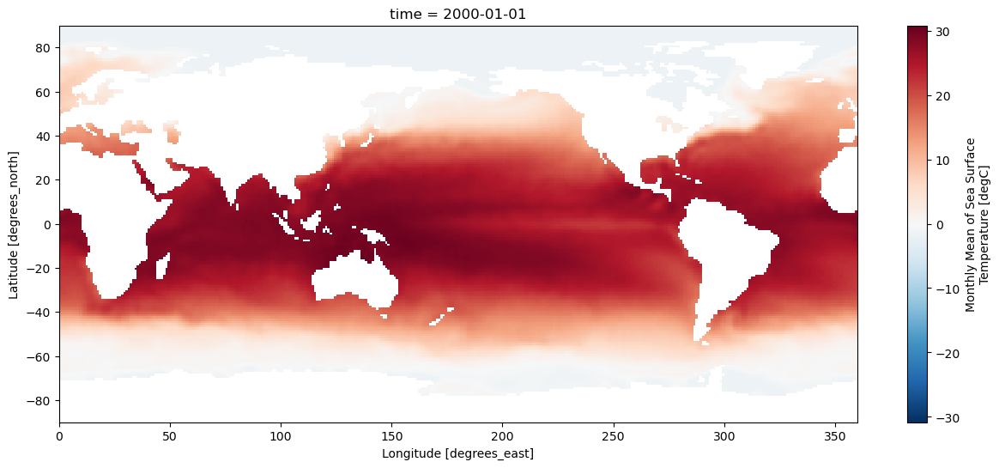

In [436]:
sst[0].plot()

掩膜后可以看见陆地上的数据被盖掉了

In [437]:
lons, lats = np.meshgrid(lon,lat)
sst_mean  = sst.mean(dim='time')
sst_mean  = np.ma.array (sst_mean, mask=np.isnan(sst_mean))
lons = np.ma.masked_invalid(lons)
lats = np.ma.masked_invalid(lats)

基于basemap进行绘图

- 等距圆柱投影

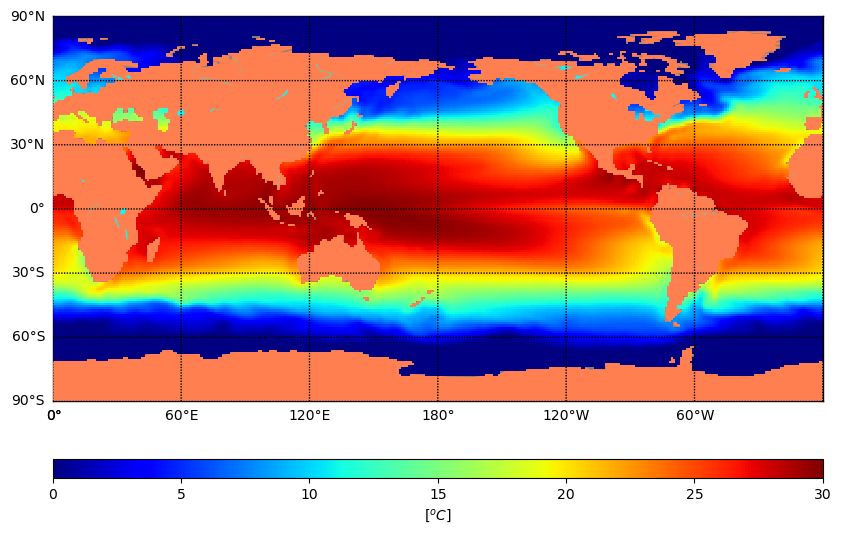

In [438]:

m = Basemap(projection='cyl', lon_0=180,resolution='c')
m.fillcontinents(color='coral',lake_color='aqua')
m.drawmapboundary(fill_color='Gray', zorder=0)
m.drawparallels(np.arange(-90.,99.,30.), labels=[1,0,0,0])
m.drawmeridians(np.arange(0.,360.,60.), labels=[0,0,0,1])
h = m.pcolormesh(lons, lats, sst_mean,latlon=True, vmin=0.0, vmax=30.0,cmap='jet')
m.colorbar(h, location='bottom', pad="15%", label='[$^oC$]')



- Robinson Projection

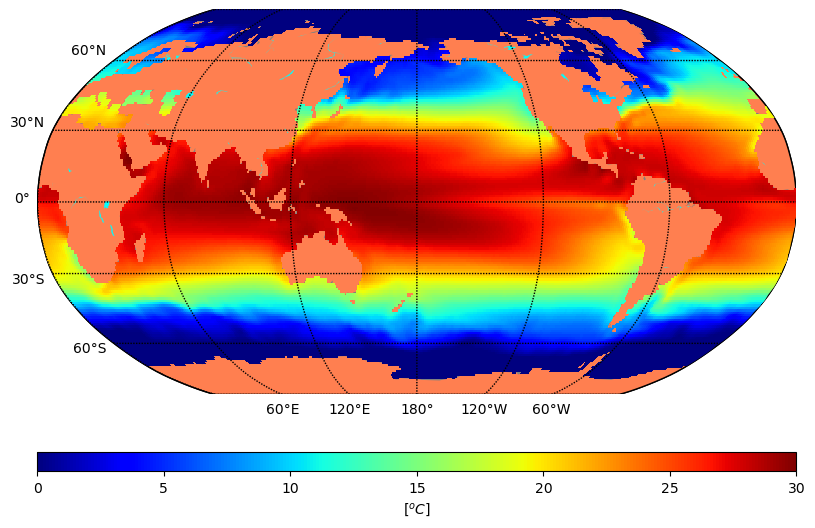

In [439]:

m = Basemap(projection='robin', lon_0=180,resolution='c')
m.fillcontinents(color='coral',lake_color='aqua')
m.drawmapboundary(fill_color='Gray', zorder=0)
m.drawparallels(np.arange(-90.,99.,30.), labels=[1,0,0,0])
m.drawmeridians(np.arange(0.,360.,60.), labels=[0,0,0,1])
h = m.pcolormesh(lons, lats, sst_mean,latlon=True,cmap='jet',vmin=0.0, vmax=30.0,)
m.colorbar(h, location='bottom', pad="15%", label='[$^oC$]')



- Full Disk Orthographic Projection

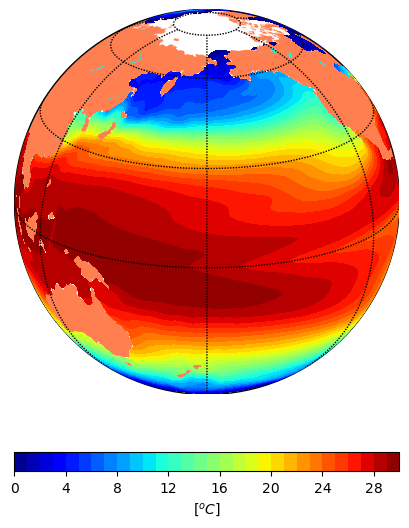

In [440]:

m = Basemap(projection='ortho', lon_0=-180, lat_0=20, resolution='c')
m.fillcontinents(color='coral', lake_color='aqua')
m.drawparallels(np.arange(0.,120.,30.))
m.drawmeridians(np.arange(0.,420.,60.))

h = m.contourf(lons, lats, sst_mean, latlon=True, cmap='jet',levels=np.linspace(0,30,31))
m.colorbar(h, location='bottom', pad="15%", label='[$^oC$]')


- Hammer Projection

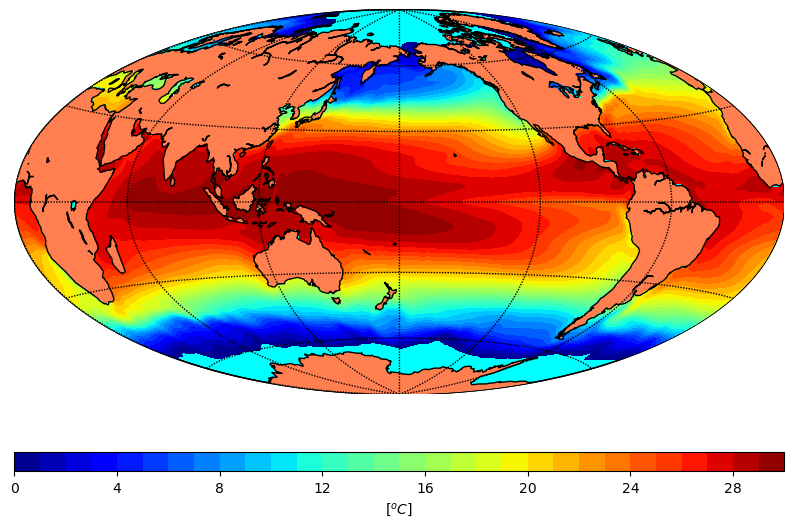

In [441]:
m = Basemap(projection='hammer', lon_0=180)

m.drawcoastlines()
m.fillcontinents(color='coral',lake_color='aqua')
# draw parallels and meridians.
m.drawparallels(np.arange(-90.,120.,30.))
m.drawmeridians(np.arange(0.,420.,60.))
m.drawmapboundary(fill_color='aqua')

h = m.contourf(lons, lats, sst_mean,latlon=True, levels=np.linspace(0,30,31),cmap='jet')
m.colorbar(h, location='bottom', pad="15%", label='[$^oC$]')

- http://unidata.github.io/netcdf4-python/

使用cartopy绘制同样的投影地图

先对于重复的代码进行封装

In [442]:
import cartopy.crs as ccrs
def set_ax(ax, lon, lat, data,proj):
    from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
    import matplotlib.ticker as mticker
    import matplotlib.ticker as ticker
    
    xstep, ystep = 6, 6
    box = [0, 360, -90, 90]
    # ax.set_xlim(box[0], box[1])
    # ax.set_ylim(box[2], box[3])
    ax.set_xticks(np.linspace(box[0], box[1], int((box[1] - box[0]) / xstep) + 1), crs=proj)
    ax.set_yticks(np.linspace(box[2], box[3], int((box[3] - box[2]) / ystep) + 1), crs=proj)
    ax.xaxis.set_major_formatter(LongitudeFormatter())
    ax.yaxis.set_major_formatter(LatitudeFormatter())
    ax.xaxis.set_major_locator(mticker.MultipleLocator(60))
    ax.yaxis.set_major_locator(mticker.MultipleLocator(30))
    ax.spines[['right', 'left', 'top', 'bottom']].set_linewidth(1.5)
    ax.spines[['right', 'left', 'top', 'bottom']].set_visible(True)
    cf = ax.contourf(lons, lats, data, cmap='jet', transform=proj, levels=np.linspace(0, 30, 31))
    ax.coastlines()
    cbar = plt.colorbar(cf, ax=ax, orientation='horizontal', pad=0.1,shrink=0.8)
    cbar.set_label('[$^oC$]')

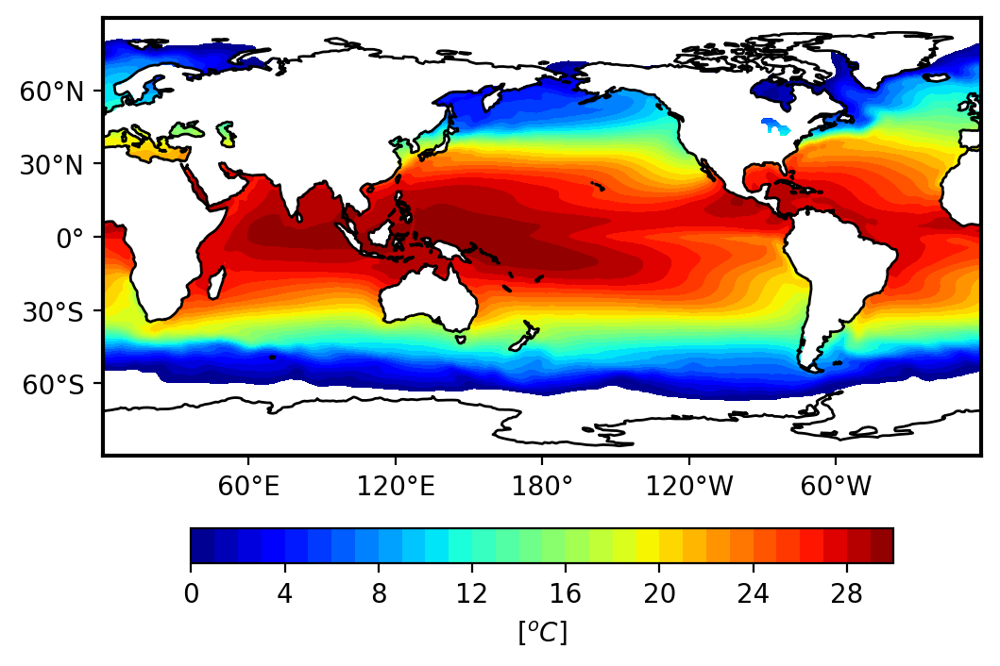

In [443]:
fig, ax = plt.subplots(figsize=(6, 5),dpi=200,
                        subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})

set_ax(ax,lon,lat,sst_mean,proj=ccrs.PlateCarree(central_longitude=0))


plt.show()

发现一个更好玩的库来绘图

In [444]:
ds

<xarray.Dataset> Size: 31MB
Dimensions:    (lat: 180, lon: 360, time: 120, nbnds: 2)
Coordinates:
  * lat        (lat) float32 720B 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * lon        (lon) float32 1kB 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
  * time       (time) datetime64[ns] 960B 2000-01-01 2000-02-01 ... 2009-12-01
Dimensions without coordinates: nbnds
Data variables:
    sst        (time, lat, lon) float32 31MB ...
    time_bnds  (time, nbnds) datetime64[ns] 2kB ...
Attributes:
    title:          NOAA Optimum Interpolation (OI) SST V2
    Conventions:    CF-1.0
    history:        Wed Apr  6 13:47:45 2005: ncks -d time,0,278 SAVEs/sst.mn...
    comments:       Data described in  Reynolds, R.W., N.A. Rayner, T.M.\nSmi...
    platform:       Model
    source:         NCEP Climate Modeling Branch
    institution:    National Centers for Environmental Prediction
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    dataset_title:  NOAA Optimum Interpolation (OI) SST V2
    source_url:     http://www.emc.ncep.noaa.gov/research/cmb/sst_analysis/

In [445]:
ds = ds.isel(time=1)

In [446]:
ds.lon

<xarray.DataArray 'lon' (lon: 360)> Size: 1kB
array([  0.5,   1.5,   2.5, ..., 357.5, 358.5, 359.5], dtype=float32)
Coordinates:
  * lon      (lon) float32 1kB 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
    time     datetime64[ns] 8B 2000-02-01
Attributes:
    units:               degrees_east
    long_name:           Longitude
    actual_range:        [  0.5 359.5]
    standard_name:       longitude
    axis:                X
    coordinate_defines:  center

In [447]:
def plot(variable='sst', projection=ccrs.PlateCarree(), width=600, height=500, levels=10, 
         cmap='Spectral', global_extent=True, **kwargs):
    
    # from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
    """Plot filled countour plots for different cartopy projections while using hvplot/holoviews/geoviews"""
    long_name = ds[variable].long_name
    print(long_name)
    units = ds[variable].units

    spacing = 80 * " "
    title = f'{long_name} {spacing} {units}'
    p = ds.hvplot(x='lon', y='lat', z=variable, projection=projection,
                width=width, height=height, cmap=cmap, dynamic=False, 
                kind='contourf', levels=levels, title=title, 
                legend='bottom', global_extent=global_extent,
                xticks=np.linspace(-180, 180, 13), 
                yticks=np.linspace(-90, 90, 7), 
                xlim=(-180, 180), ylim=(-90, 90),  

                ylabel=f'{ds.lat.long_name}[{ds.lat.units}]', 
                xlabel=f'{ds.lon.long_name}[{ds.lon.units}]',
                **kwargs
    ) * gv.feature.coastline
    p.opts(
        xticks=[(x, LongitudeFormatter()(x)) for x in np.linspace(-180, 180, 13)],
        yticks=[(y, LatitudeFormatter()(y)) for y in np.linspace(-90, 90, 7)]
    )
    return p

- PlateCarree

In [448]:
plot( projection=ccrs.PlateCarree(180), cmap='jet', levels=np.linspace(0, 30, 31), global_extent=True)


Monthly Mean of Sea Surface Temperature


:Overlay
   .Polygons.I  :Polygons   [lon,lat]   (Monthly Mean of Sea Surface Temperature)
   .Coastline.I :Feature   [Longitude,Latitude]

- AlbersEqualArea

In [449]:
plot(projection=ccrs.AlbersEqualArea(180),cmap='jet', levels=np.linspace(0, 30, 31), global_extent=True)

Monthly Mean of Sea Surface Temperature


:Overlay
   .Polygons.I  :Polygons   [lon,lat]   (Monthly Mean of Sea Surface Temperature)
   .Coastline.I :Feature   [Longitude,Latitude]

- EquidistantConic

In [450]:
plot(projection=ccrs.EquidistantConic(180),cmap='jet', levels=np.linspace(0, 30, 31), global_extent=True)

Monthly Mean of Sea Surface Temperature


:Overlay
   .Polygons.I  :Polygons   [lon,lat]   (Monthly Mean of Sea Surface Temperature)
   .Coastline.I :Feature   [Longitude,Latitude]

- LambertConformal

In [451]:
plot(projection=ccrs.LambertConformal(180), levels=np.linspace(0, 30, 31),cmap='jet', global_extent=True)

Monthly Mean of Sea Surface Temperature


:Overlay
   .Polygons.I  :Polygons   [lon,lat]   (Monthly Mean of Sea Surface Temperature)
   .Coastline.I :Feature   [Longitude,Latitude]

LambertCylindrical


In [452]:
plot(projection=ccrs.LambertCylindrical(central_longitude=-180), levels=np.linspace(0, 30, 31),cmap='jet', global_extent=True)

Monthly Mean of Sea Surface Temperature


:Overlay
   .Polygons.I  :Polygons   [lon,lat]   (Monthly Mean of Sea Surface Temperature)
   .Coastline.I :Feature   [Longitude,Latitude]

- Robinson

In [453]:
plot(projection=ccrs.Robinson(180), levels=np.linspace(0, 30, 31),cmap='jet', global_extent=True)

Monthly Mean of Sea Surface Temperature


:Overlay
   .Polygons.I  :Polygons   [lon,lat]   (Monthly Mean of Sea Surface Temperature)
   .Coastline.I :Feature   [Longitude,Latitude]

- SouthPolarStereo

In [454]:
plot(projection=ccrs.SouthPolarStereo(0), levels=np.linspace(0, 30, 31),cmap='jet', global_extent=True)

Monthly Mean of Sea Surface Temperature


:Overlay
   .Polygons.I  :Polygons   [lon,lat]   (Monthly Mean of Sea Surface Temperature)
   .Coastline.I :Feature   [Longitude,Latitude]

- NorthPolarStereo

In [455]:
plot(projection=ccrs.NorthPolarStereo(180), levels=np.linspace(0, 30, 31),cmap='jet', global_extent=True)

Monthly Mean of Sea Surface Temperature


:Overlay
   .Polygons.I  :Polygons   [lon,lat]   (Monthly Mean of Sea Surface Temperature)
   .Coastline.I :Feature   [Longitude,Latitude]

>https://ncar-hackathons.github.io/visualization/cartopy-basics.html
>
>https://ncar-hackathons.github.io/visualization/examples/cartopy_map_projections.html